# Feature Engineering für eine Drohnen Fernsteuerung, die mit einem MPU6050 ausgestattet ist

## 1. Einlesen der Datei und überprüfen, ob die Datenreihen vollständig sind

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix as scatmat
import os


# Absolute Pfad zur Datei extrahieren
#ziel_pfad = 'D:\measurements'
ziel_pfad = '../Daten/'

# CSV-Datei einlesen
data = pd.read_csv(os.path.join(ziel_pfad, 'mpu6050_lennard_run1.csv'), sep=',', decimal='.')
data2 = pd.read_csv(os.path.join(ziel_pfad, 'mpu6050_lennard_run2.csv'), sep=',', decimal='.')
data = pd.concat([data, data2], ignore_index=True)

# Die ersten Zeilen anzeigen
data.head()

# Informationen über den Datensatz anzeigen
data.info()

# Sind alle Klassen gleich stark vertreten?
data['RuheState'].value_counts()

# Gibt es Auffälligkeiten bei der Verteilung der Werte?

data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9120 entries, 0 to 9119
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   AccX         9120 non-null   float64
 1   AccY         9120 non-null   float64
 2   AccZ         9120 non-null   float64
 3   GyroX        9120 non-null   float64
 4   GyroY        9120 non-null   float64
 5   GyroZ        9120 non-null   float64
 6   AngleX       9120 non-null   float64
 7   AngleY       9120 non-null   float64
 8   AngleZ       9120 non-null   float64
 9   AccAngleX    9120 non-null   float64
 10  AccAngleY    9120 non-null   float64
 11  RuheState    9120 non-null   int64  
 12  FernstState  9120 non-null   int64  
 13  TranspState  9120 non-null   int64  
dtypes: float64(11), int64(3)
memory usage: 997.6 KB


,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,AngleX,AngleY,AngleZ,AccAngleX,AccAngleY,RuheState,FernstState,TranspState
count,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000,9120.000000
mean,-0.124444,0.120000,0.897729,-0.187314,-0.457338,-2.290510,7.328550,7.227452,-644.019330,7.175341,3.379365,0.319079,0.351974,0.328947
std,0.501435,0.421644,0.337752,41.130489,38.532537,38.004965,35.513037,33.610919,474.705076,29.835002,26.025703,0.466145,0.477612,0.469857
min,-1.640134,-1.847535,-1.105839,-498.599823,-299.504578,-270.363739,-178.105057,-89.975670,-2336.003662,-179.495193,-88.617310,0.000000,0.000000,0.000000
25%,-0.404477,-0.013063,0.761731,-5.065466,-6.470230,-4.305595,-1.009308,-0.168664,-799.939331,-0.730754,-3.144068,0.000000,0.000000,0.000000
50%,-0.119626,0.033687,0.993933,0.407817,0.235877,-0.317954,1.777564,8.704584,-526.080566,1.358691,6.803437,0.000000,0.000000,0.000000
75%,0.054507,0.327636,1.036605,6.341107,5.233182,1.483573,15.253549,29.498145,-327.444359,18.005214,21.259746,1.000000,1.000000,1.000000
max,1.857852,1.776244,2.463436,470.987976,354.999237,264.063751,161.326920,89.965271,71.008202,178.724503,86.276085,1.000000,1.000000,1.000000


## 2. Irrelevante Merkmale entfernen

In [ ]:
# data = data.drop(['user', 'gender'], axis=1)

# 3. Visualisierung der Verteilung der numerischen Werte

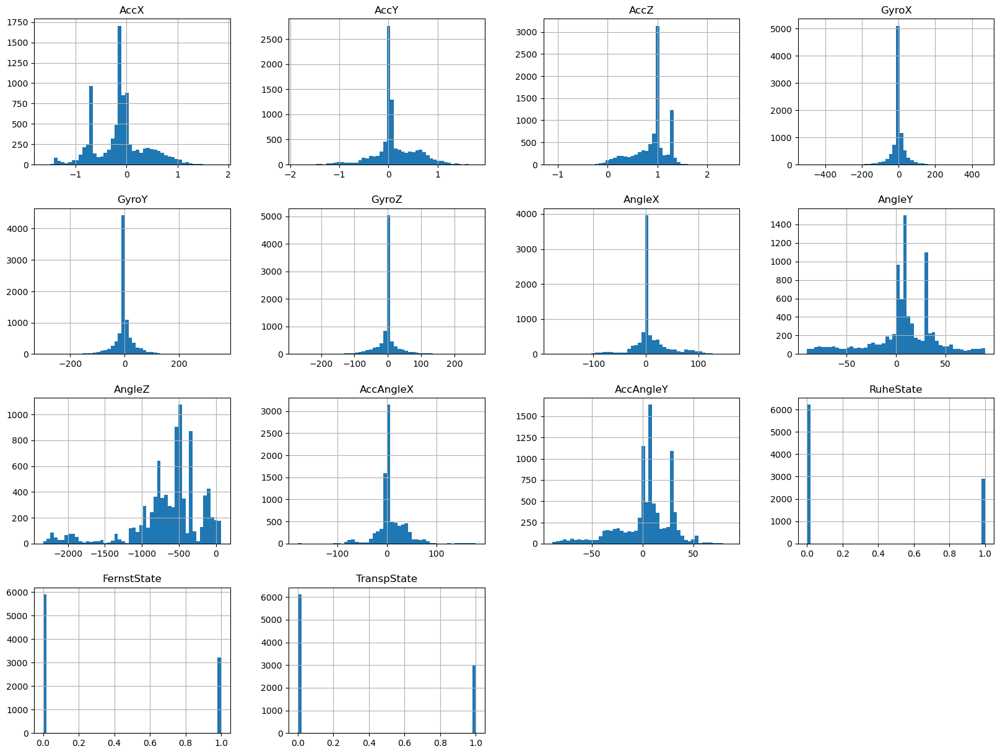

In [2]:
%matplotlib inline
from matplotlib import pyplot as plt
data.hist(bins=50, figsize=(20, 15))
plt.show()

## 4. Überprüfen, ob es fehlerhafte Werte gibt (Bspw.: in Spalte 'AccX')

In [3]:
pd.set_option('display.max_rows', 300)
data['AccX'].value_counts()

AccX
-0.030027    27
-0.126951    25
-0.027830    25
-0.117917    25
-0.029783    24
             ..
 0.233157     1
 0.383059     1
 0.303713     1
 0.115481     1
 0.131451     1
Name: count, Length: 4662, dtype: int64

## 5. Fehlerhaften Wert korrigieren (Beispiel)

In [4]:
#data.loc[data['z4'] == '-14420-11-2011 04:50:23.713', 'z4'] = -144

# Spalte 'z4' in numerischen Typ umwandeln
#data['z4'] = pd.to_numeric(data['z4'])

# Informationen über den Datensatz erneut anzeigen
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9120 entries, 0 to 9119
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   AccX         9120 non-null   float64
 1   AccY         9120 non-null   float64
 2   AccZ         9120 non-null   float64
 3   GyroX        9120 non-null   float64
 4   GyroY        9120 non-null   float64
 5   GyroZ        9120 non-null   float64
 6   AngleX       9120 non-null   float64
 7   AngleY       9120 non-null   float64
 8   AngleZ       9120 non-null   float64
 9   AccAngleX    9120 non-null   float64
 10  AccAngleY    9120 non-null   float64
 11  RuheState    9120 non-null   int64  
 12  FernstState  9120 non-null   int64  
 13  TranspState  9120 non-null   int64  
dtypes: float64(11), int64(3)
memory usage: 997.6 KB


## MinMaxScaler 

In [5]:
# Skalieren

from sklearn.preprocessing import MinMaxScaler
#data.drop('class', axis=1, inplace=True) # Ist bereits in Schritt 11 erfolgt
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)
#print("data_scaled.shape:", data_scaled.shape, "\ndata_scaled:\n", data_scaled) # uncomment to visualize details

# Robust Scaler 

In [6]:
# Das ist eine Alternative zum MinMaxScaler, der robust gegenüber auffällig hohen / tiefen Werten ist

from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
data_scaled = scaler.fit_transform(data)

In [7]:
data_scaled_pp_df = pd.DataFrame(data_scaled, columns=data.columns)

## 6. Aufteilung des Datensatzes in Trainings- und Validierungsdaten

In [36]:
# Aufteilung in Trainings- und Validierungsdatensätze
train, val = train_test_split(data_scaled_pp_df, test_size=0.1, random_state=42)

# Anzahl der Datensätze anzeigen
len(train), len(val)

# Kopie des Trainingsdatensatzes für Modifikationen
data_scaled = train.copy()


In [19]:
data_scaled

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,AngleX,AngleY,AngleZ,AccAngleX,AccAngleY,RuheState,FernstState,TranspState
1516,-1.744644,-0.788613,1.125632,-3.104981,1.475446,-1.381264,-0.946884,0.982289,0.103385,-0.519690,1.147147,0.0,1.0,0.0
7966,-0.020214,-0.089206,0.051515,0.009369,0.003914,0.018460,-0.067516,-0.142493,-0.338191,-0.062603,0.019806,1.0,0.0,0.0
5221,0.138828,-0.044777,0.369486,2.733124,-2.868609,0.400854,-0.149438,-0.074832,-0.545293,-0.021138,-0.159092,0.0,1.0,0.0
3122,2.642553,0.303483,-2.432758,-6.417888,-3.777850,0.461509,-6.930625,2.680436,1.074191,0.293259,-3.233579,0.0,0.0,1.0
1034,-2.032941,-1.713725,0.202802,-2.229632,1.749392,-1.784754,-1.995854,1.515277,0.203266,-1.156467,1.426432,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,1.221809,1.594773,-1.374921,2.386464,3.095594,-4.121939,1.959370,-1.331994,-0.016579,1.917857,-1.409553,0.0,1.0,0.0
5191,0.202658,1.139741,0.014210,10.991386,-0.941854,2.028004,1.611048,-0.372213,-0.520722,1.150621,-0.221134,0.0,1.0,0.0
5390,-0.439895,-2.297011,-1.547229,-0.851257,-0.177413,2.507974,-2.771463,0.220651,-0.542225,-2.682613,0.494759,0.0,1.0,0.0
860,0.834262,1.298790,-0.076741,4.245612,6.009989,13.170303,2.640758,-0.273196,-3.690317,1.277283,-0.838635,0.0,0.0,1.0


## 7. Begrenzung der Auswahl auf die Sensorspalten

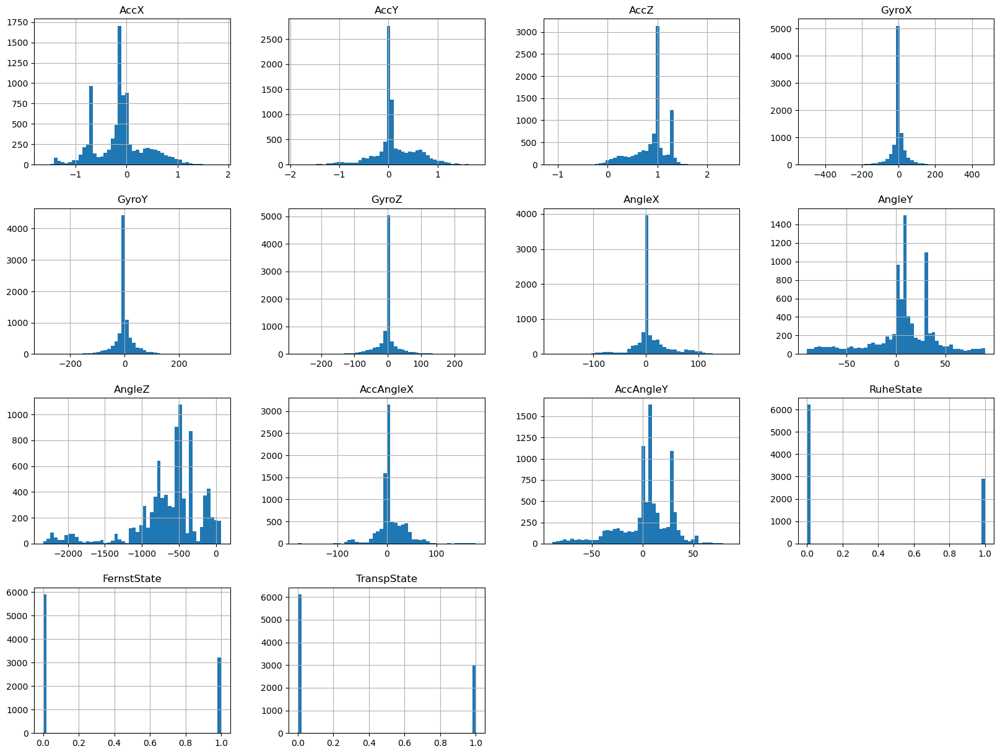

In [9]:
data.hist(bins=50, figsize=(20, 15))
plt.show()

## 8. Prüfung der Korrelationen für verschiedene Sensoren

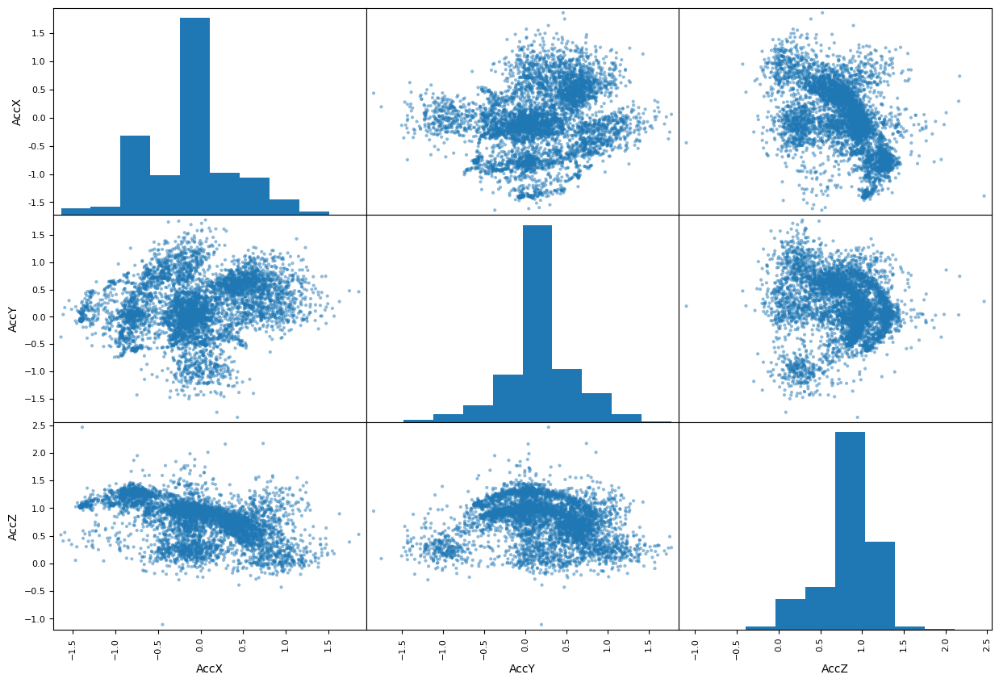

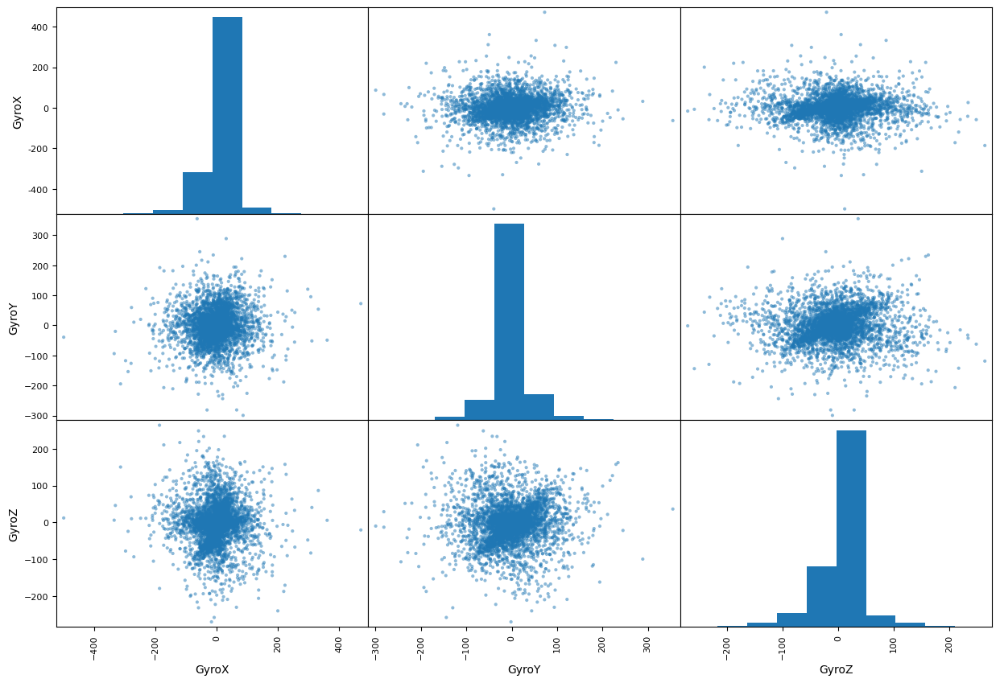

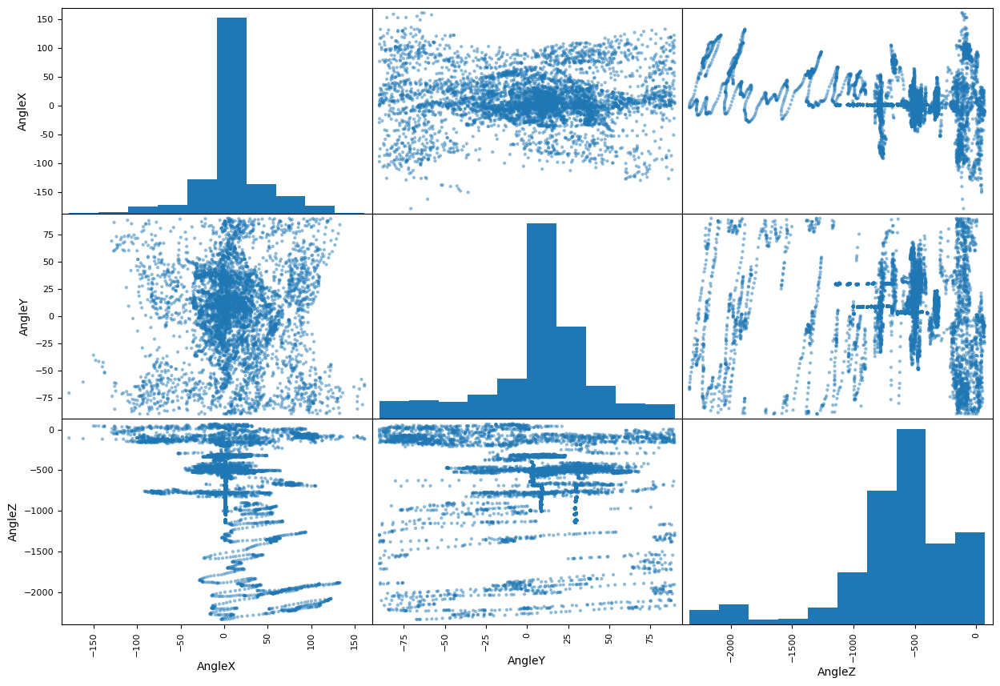

In [10]:
sensors = ['AccX', 'AccY', 'AccZ', 'GyroX', 'GyroY', 'GyroZ', 'AngleX', 'AngleY', 'AngleZ', 'RuheState', 'FernstState', 'TranspState']

for sensor_group in [sensors[:3], sensors[3:6], sensors[6:9]]:
    scatmat(data[sensor_group], figsize=(15, 10))
    plt.show()

## 9. Visualisierung der Klassenzuordnung im Scatterplot

In [11]:
# Gruppiere nach den Klassenattributen und zähle die Anzahl der Vorkommen
class_counts = data.groupby(['RuheState', 'FernstState', 'TranspState']).size().reset_index(name='count')

# Anzeige aller Kombinationen
for i, row in class_counts.iterrows():
    print(f"Klasse {i}: Ruhe={row['RuheState']}, Fernsteuerung={row['FernstState']}, Transport={row['TranspState']} - Anzahl: {row['count']}")


Klasse 0: Ruhe=0, Fernsteuerung=0, Transport=1 - Anzahl: 3000
Klasse 1: Ruhe=0, Fernsteuerung=1, Transport=0 - Anzahl: 3210
Klasse 2: Ruhe=1, Fernsteuerung=0, Transport=0 - Anzahl: 2910


## 10. Scatterplots der unskalierten Daten für verschiedene Sensorpaare

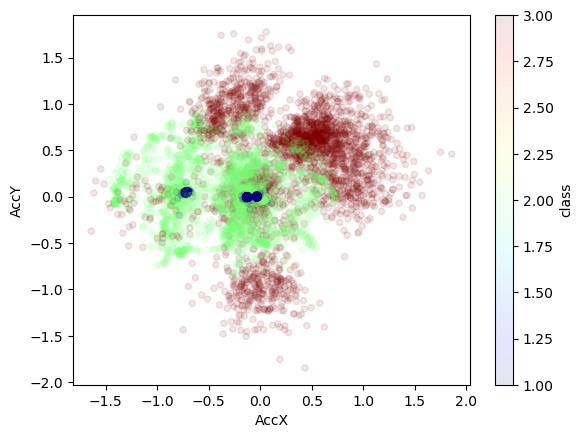

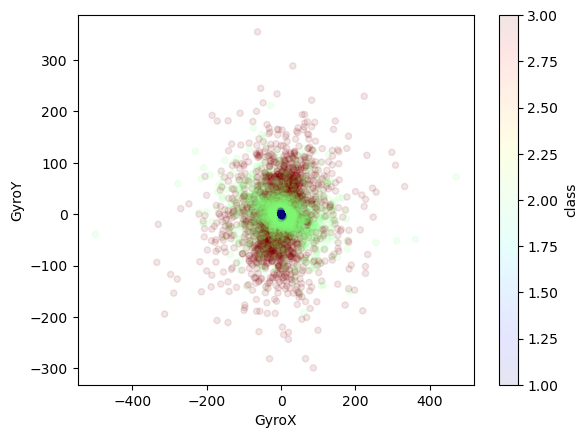

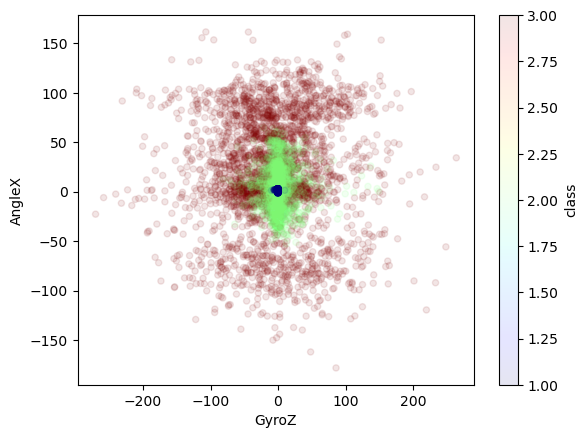

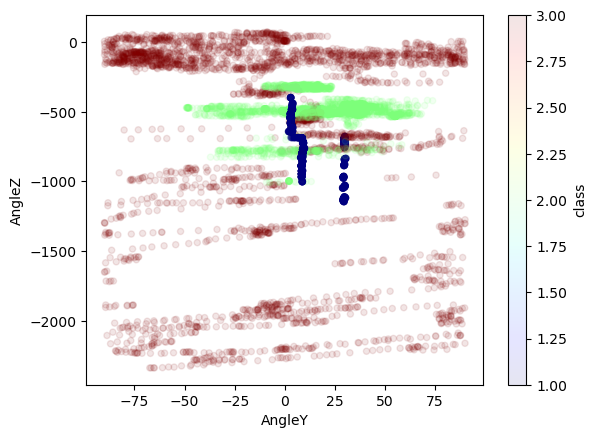

In [12]:
# Erstelle eine temporäre Spalte 'class' basierend auf One-Hot-Encoding
data['class'] = data.apply(lambda row: 1 if row['RuheState'] == 1 else (2 if row['FernstState'] == 1 else 3), axis=1)

# Visualisiere Scatterplots für jedes Sensor-Paar
sensor_pairs = [('AccX', 'AccY'), ('GyroX', 'GyroY'), ('GyroZ', 'AngleX'), ('AngleY', 'AngleZ')]
for pair in sensor_pairs:
    data.plot(kind="scatter", x=pair[0], y=pair[1], alpha=0.1, c='class', cmap=plt.get_cmap('jet'))
    #plt.title(f'Unskalierte Werte - {pair[0]} vs. {pair[1]}')
    plt.show()

# Entferne die temporäre 'class'-Spalte
data.drop('class', axis=1, inplace=True)


## 11. One Hot encoding der Klasse durchführen, wenn noch nicht geschehen (Beispiel)

In [ ]:
#from sklearn.preprocessing import OneHotEncoder
#encoder = OneHotEncoder(categories='auto');
#data_label_matrix = data["class"].values.reshape(-1, 1)
#data_labels_1hot = encoder.fit_transform(data_label_matrix)
#data_labels_1hot.shape

## 14. Skatterplots von Messwertpaaren mit vorheriger Skalierung

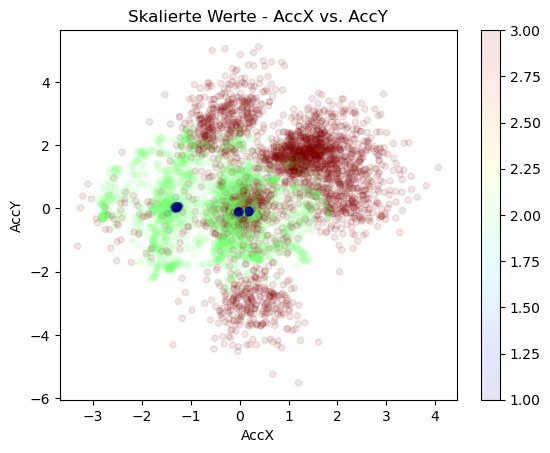

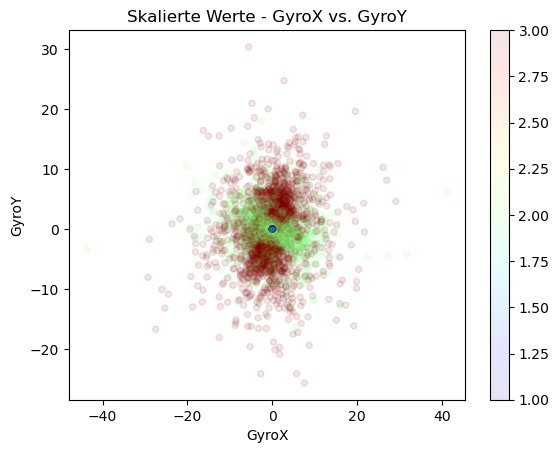

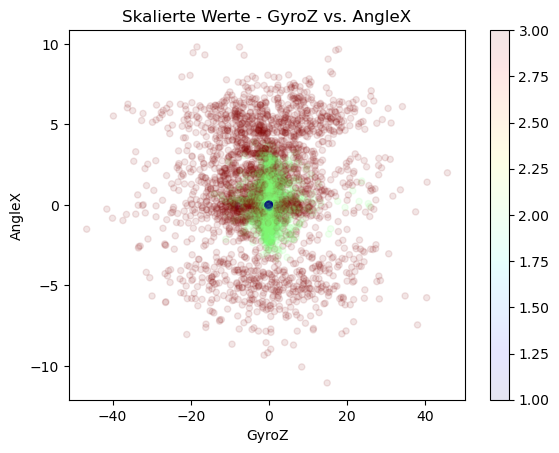

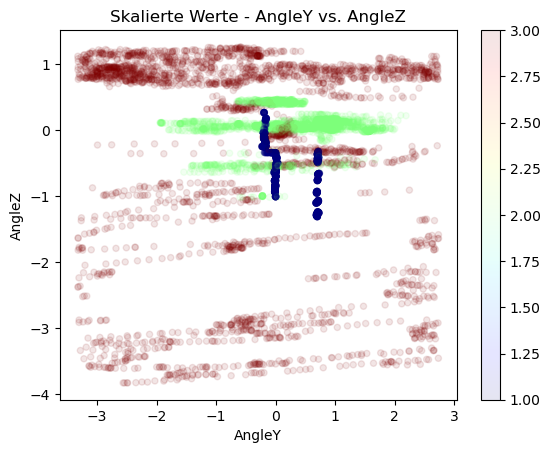

In [13]:
# Skalierte Werte in einem neuen DataFrame mit den ursprünglichen Spaltennamen
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)


# Erstelle eine temporäre Spalte 'class' basierend auf One-Hot-Encoding
data_scaled_df['class'] = data_scaled_df.apply(lambda row: 1 if row['RuheState'] == 1 else (2 if row['FernstState'] == 1 else 3), axis=1)


# Visualisiere Scatterplots für jedes Sensor-Paar mit den skalierten Werten und den originalen Klassen
sensor_pairs = [('AccX', 'AccY'), ('GyroX', 'GyroY'), ('GyroZ', 'AngleX'), ('AngleY', 'AngleZ')]
for pair in sensor_pairs:
    data_scaled_df.plot(kind="scatter", x=pair[0], y=pair[1], alpha=0.1, c=data_scaled_df['class'], cmap=plt.get_cmap('jet'))
    plt.title(f'Skalierte Werte - {pair[0]} vs. {pair[1]}')
    plt.show()

# Entferne die temporäre 'class'-Spalte
#data_scaled_df.drop('class', axis=1, inplace=True)


36


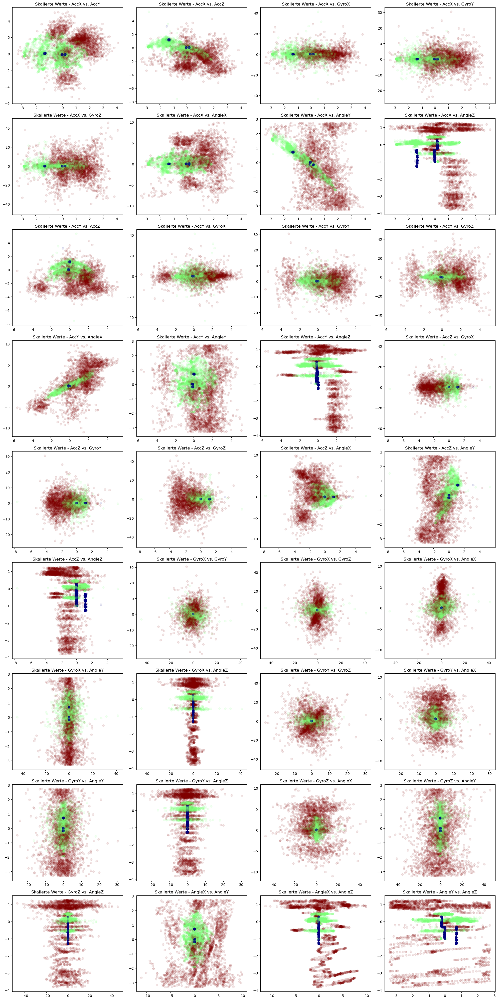

In [14]:
from itertools import combinations

# Annahme: 'data' ist dein ursprüngliches DataFrame mit den Daten

# Skalierte Werte in einem neuen DataFrame mit den ursprünglichen Spaltennamen
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)

# Erstelle eine temporäre Spalte 'class' basierend auf One-Hot-Encoding
data_scaled_df['class'] = data_scaled_df.apply(lambda row: 1 if row['RuheState'] == 1 else (2 if row['FernstState'] == 1 else 3), axis=1)

# Liste aller Labels
all_labels = ['AccX', 'AccY', 'AccZ', 'GyroX', 'GyroY', 'GyroZ', 'AngleX', 'AngleY', 'AngleZ', 'RuheState', 'FernstState', 'TranspState']

# Erstelle alle möglichen Kombinationen von Label-Paaren
label_pairs = list(combinations(all_labels[0:9], 2))
print(len(label_pairs))

# Anzahl der Zeilen und Spalten für die Subplots
num_rows = 9  # Du kannst dies anpassen, um die Anzahl der gewünschten Zeilen zu ändern
num_cols = 4  # Du kannst dies anpassen, um die Anzahl der gewünschten Spalten zu ändern

# Erstelle Subplots
#plt.figure(figsize=(10, 8))
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 40))

# Iteriere durch Label-Paare und erstelle Scatterplots
for i in range(num_rows):
    for j in range(num_cols):
        label_pair = label_pairs[i * num_cols + j]
        axs[i, j].scatter(data_scaled_df[label_pair[0]], data_scaled_df[label_pair[1]], alpha=0.1, c=data_scaled_df['class'], cmap=plt.get_cmap('jet'))
        axs[i, j].set_title(f'Skalierte Werte - {label_pair[0]} vs. {label_pair[1]}')

# Verbessere das Layout
plt.tight_layout()
plt.show()


# 15. Auswahl von Sensoren

6


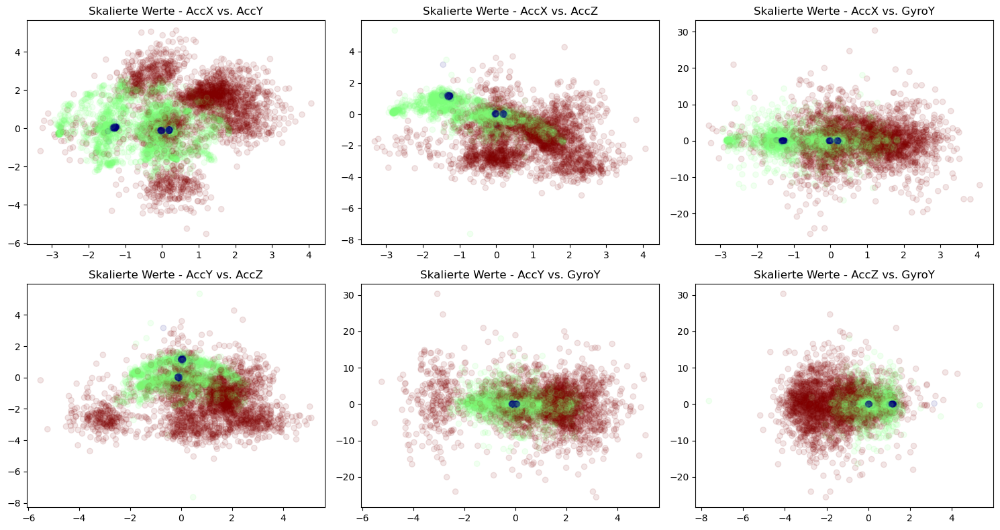

In [39]:
#from itertools import combinations
import pandas as pd
import matplotlib.pyplot as plt

# Annahme: 'data' ist dein ursprüngliches DataFrame mit den Daten
# Annahme: 'data_scaled' ist dein skaliertes DataFrame

# Skalierte Werte in einem neuen DataFrame mit den ursprünglichen Spaltennamen
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)

# Erstelle eine temporäre Spalte 'class' basierend auf One-Hot-Encoding
data_scaled_df['class'] = data_scaled_df.apply(lambda row: 1 if row['RuheState'] == 1 else (2 if row['FernstState'] == 1 else 3), axis=1)

# Liste der ausgewählten Sensoren
selected_sensors = ['AccX', 'AccY', 'AccZ', 'GyroY']

# Erstelle alle möglichen Kombinationen von Label-Paaren für die ausgewählten Sensoren
label_pairs = list(combinations(selected_sensors, 2))
print(len(label_pairs))

# Anzahl der Zeilen und Spalten für die Subplots
num_rows = 2  # Festgelegte Anzahl der Zeilen basierend auf der Anzahl der ausgewählten Sensoren
num_cols = len(selected_sensors) - 1  # Eine Spalte weniger als die Anzahl der ausgewählten Sensoren

# Erstelle Subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 8))

# Iteriere durch Label-Paare und erstelle Scatterplots
for i in range(num_rows):
    for j in range(num_cols):
        label_pair = label_pairs[i * num_cols + j]
        axs[i, j].scatter(data_scaled_df[label_pair[0]], data_scaled_df[label_pair[1]], alpha=0.1, c=data_scaled_df['class'], cmap=plt.get_cmap('jet'))
        axs[i, j].set_title(f'Skalierte Werte - {label_pair[0]} vs. {label_pair[1]}')

# Verbessere das Layout
plt.tight_layout()
plt.show()


# 16. Training des kNN

In [40]:
from sklearn import neighbors
import numpy as np

num_features = 14
X = np.zeros([len(data_scaled_df), num_features])
y = data_scaled_df['class']

k = 5
clf = neighbors.KNeighborsClassifier(n_neighbors=k)
features = data_scaled_df.drop(columns='RuheState').drop(columns='class').drop(columns='TranspState').drop(columns='FernstState')
clf.fit(features, y)

KNeighborsClassifier()

In [18]:
features

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,AngleX,AngleY,AngleZ,AccAngleX,AccAngleY
1516,-1.744644,-0.788613,1.125632,-3.104981,1.475446,-1.381264,-0.946884,0.982289,0.103385,-0.519690,1.147147
7966,-0.020214,-0.089206,0.051515,0.009369,0.003914,0.018460,-0.067516,-0.142493,-0.338191,-0.062603,0.019806
5221,0.138828,-0.044777,0.369486,2.733124,-2.868609,0.400854,-0.149438,-0.074832,-0.545293,-0.021138,-0.159092
3122,2.642553,0.303483,-2.432758,-6.417888,-3.777850,0.461509,-6.930625,2.680436,1.074191,0.293259,-3.233579
1034,-2.032941,-1.713725,0.202802,-2.229632,1.749392,-1.784754,-1.995854,1.515277,0.203266,-1.156467,1.426432
...,...,...,...,...,...,...,...,...,...,...,...
5734,1.221809,1.594773,-1.374921,2.386464,3.095594,-4.121939,1.959370,-1.331994,-0.016579,1.917857,-1.409553
5191,0.202658,1.139741,0.014210,10.991386,-0.941854,2.028004,1.611048,-0.372213,-0.520722,1.150621,-0.221134
5390,-0.439895,-2.297011,-1.547229,-0.851257,-0.177413,2.507974,-2.771463,0.220651,-0.542225,-2.682613,0.494759
860,0.834262,1.298790,-0.076741,4.245612,6.009989,13.170303,2.640758,-0.273196,-3.690317,1.277283,-0.838635


# 17. Prediction

In [41]:
# Prediction mit Test-Array
y_predict = clf.predict(features)

acc = np.mean(y_predict == (data_scaled_df['class']).astype(int).values)
acc

0.9717348927875243

In [35]:
# Prediction mit Validation-Array

# Skalierte Werte in einem neuen DataFrame mit den ursprünglichen Spaltennamen
val_df = pd.DataFrame(val, columns=data.columns)

# Erstelle eine temporäre Spalte 'class' basierend auf One-Hot-Encoding
val_df['class'] = val_df.apply(lambda row: 1 if row['RuheState'] == 1 else (2 if row['FernstState'] == 1 else 3), axis=1)

val_labels = val_df['class']
val_data = val_df.drop(columns='RuheState').drop(columns='class').drop(columns='TranspState').drop(columns='FernstState')

# Prediction
prediction = clf.predict(val_data)

acc = np.mean(prediction == val_labels.astype(int).values)
acc

ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- AccAngleX
- AccAngleY
- AccZ
- AngleX
- AngleY
- ...


# Python MQTT Client

In [ ]:
live_data = {'AccX' :[],
        'AccY' : [],
        'AccZ' : [],
        'GyroX' : [],
        'GyroY' : [],
        'GyroZ' : [],
        'AngleX' : [],
        'AngleY' : [],
        'AngleZ' : [],
        'AccAngleX' : [],
        'AccAngleY' : [],     
        'RuheState' : 0,
        'FernstState' : 0,
        'TranspState' : 0,}

live_data_df = pd.DataFrame(live_data)


live_data_df.describe()

# MQTT Live-Prediction

In [ ]:
import paho.mqtt.client as mqtt
from IPython.display import clear_output


live_data_df = pd.DataFrame(live_data)

# The callback for when the client receives a CONNACK response from the server.
def on_connect(client, userdata, flags, rc):
    print("Connected with result code "+str(rc))

    # Subscribing in on_connect() means that if we lose the connection and
    # reconnect then subscriptions will be renewed.
    # client.subscribe("$SYS/#")

# The callback for when a PUBLISH message is received from the server.
counter = 0 # counts how many times angleZ is received 

def on_message(client, userdata, msg):
    # print(msg.topic+" "+str(msg.payload))
    global accX, accY, accZ, gyroX, gyroY, gyroZ, angleX, angleY, angleZ, accAngleX, accAngleY, live_data_df
    global counter
    if(msg.topic == 'accelerationX'):
        accX = msg.payload.decode('UTF-8')
        #print(accX)
    elif(msg.topic == 'accelerationY'):
        accY = msg.payload.decode('UTF-8')
        #print(accY)
    elif(msg.topic == 'accelerationZ'):
        accZ = msg.payload.decode('UTF-8')
    
    elif(msg.topic == 'gyrometerX'):
        gyroX = msg.payload.decode('UTF-8')
    elif(msg.topic == 'gyrometerY'):
        gyroY = msg.payload.decode('UTF-8')
    elif(msg.topic == 'gyrometerZ'):
        gyroZ = msg.payload.decode('UTF-8')

    elif(msg.topic == 'angleX'):
        angleX = msg.payload.decode('UTF-8')
    elif(msg.topic == 'angleY'):
        angleY = msg.payload.decode('UTF-8')
    elif(msg.topic == 'angleZ'):
        angleZ = msg.payload.decode('UTF-8')
    elif(msg.topic == 'accAngleX'):
        accAngleX = msg.payload.decode('UTF-8')
    elif(msg.topic == 'accAngleY'):
        accAngleY = msg.payload.decode('UTF-8')
        counter += 1

        new_row = {
        'AccX' :[accX],
        'AccY' : [accY],
        'AccZ' : [accZ],
        'GyroX' : [gyroX],
        'GyroY' : [gyroY],
        'GyroZ' : [gyroZ],
        'AngleX' : [angleX],
        'AngleY' : [angleY],
        'AngleZ' : [angleZ],
        'AccAngleX' : [accAngleX],
        'AccAngleY' : [accAngleY],
        'RuheState' : 0,
        'FernstState' : 0,
        'TranspState' : 0,
        }
        
        # convert new Data to DataFrame
        new_row = pd.DataFrame(new_row)

        # append new row to live_data_df
        live_data_df = pd.concat([new_row, live_data_df], ignore_index=True)

        # after 30 measurements, call the classifier
        if counter == 10:
            counter = 0
            live_data_scaled = pd.DataFrame(scaler.transform(live_data_df), columns=data.columns)   # scaling our data
            live_data_features = live_data_scaled.drop(columns='RuheState').drop(columns='TranspState').drop(columns='FernstState')
            # live_data_features = live_data_scaled[['AccY', 'GyroX']]

            std_df = live_data_features[selected_columns].std().to_frame().transpose()
            #print(std_df)

            #std_df = pd.DataFrame([['AccY', 'GyroX'], [std_accy, std_gyrox]])

            live_predict = clf.predict(std_df)
            print('Prediction: ', str(live_predict.mean()))
            if round(live_predict.mean()) == 1:
                print('Ruhe') 
            elif round(live_predict.mean()) == 2:
                print('Fernsteuerung') 
            elif round(live_predict.mean()) == 3:
                print('Transport')


            # Plotting 
            plt.figure(figsize=(10, 7))
            plt.scatter(train['AccY'], train['GyroX'],marker=".", alpha=0.3, c=data_scaled_df['class'], cmap=plt.get_cmap('rainbow'))
            plt.scatter(std_df['AccY'], std_df['GyroX'], marker="P", alpha=0.9, c=4, cmap=plt.get_cmap('jet'))
            #print(live_data_features)
            # axes = plt.gca()
            # axes.set_xlim([-5, 5])
            # axes.set_ylim([-20, 20])

            ## ACHTUNG: Glaube die Labels der Prediction passen nicht zu den Features. Im Plot sind falsche Farben in falschen Bereichen zu erkennen

            # Verbessere das Layout
            plt.tight_layout()
            plt.show()

            clear_output(wait=True)

            # Reset live_predict and live_data_df
            live_predict = None
            live_data_df = live_data_df.head(20) # keep 20 rows of the currenct frame

    

client = mqtt.Client()
client.on_connect = on_connect
client.on_message = on_message

client.connect("192.168.137.1", 1883, 60)
client.subscribe("ESP_message", 0)
client.subscribe("accelerationX", 0)
client.subscribe("accelerationY", 0)
client.subscribe("accelerationZ", 0)
client.subscribe("gyrometerX", 0)
client.subscribe("gyrometerY", 0)
client.subscribe("gyrometerZ", 0)
client.subscribe("angleX", 0)
client.subscribe("angleY", 0)
client.subscribe("angleZ", 0)
client.subscribe("accAngleX", 0)
client.subscribe("accAngleY", 0)


# Blocking call that processes network traffic, dispatches callbacks and
# handles reconnecting.
# Other loop*() functions are available that give a threaded interface and a
# manual interface.
client.loop_forever()

In [20]:
# Standardabweichung

data_features = data[['AccY', 'GyroX']]

std_accy = data_features[['AccY']]
std_gyrox = data_features[['GyroX']]


In [21]:
x = np.linspace(0, 1, 100)
X0, X1 = np.meshgrid(x, x)
Xstack = np.dstack((X0, X1))
Y = np.zeros(X0.shape)
for r in range(100):
    for c in range(100):
        Y[r, c] = clf.predict(Xstack[r, c, :].reshape(1, -1))

plt.contourf(X0, X1, Y, cmap=plt.get_cmap('jet'))


c:\Users\W0rkstation\miniconda3\envs\ST\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


ValueError: X has 2 features, but KNeighborsClassifier is expecting 11 features as input.

# Ansatz Classifier nur mit Acc Y und Gyro X

In [22]:
# Training

num_features = 14
labels = data_scaled_df['class']

k = 5
clf = neighbors.KNeighborsClassifier(n_neighbors=k)
features = data_scaled_df[['AccY', 'GyroX']]
clf.fit(features, labels)

KNeighborsClassifier()

In [23]:
# Prediction

val_labels = val_df['class']
val_features = val_df[['AccY', 'GyroX']]

# Prediction
prediction = clf.predict(val_features)

acc = np.mean(prediction == val_labels.astype(int).values)
acc

0.7883771929824561

# Confusion Matrix

In [ ]:
import seaborn as sns
import pandas as pd

def confusion_matrix(results, labels):
    data = {'y_Actual': results.astype(np.uint8), 'y_Predicted': labels}
    df = pd.DataFrame(data, columns=['y_Actual', 'y_Predicted'])
    cm = pd.crosstab(df['y_Actual'], df['y_Predicted'])
    cm = cm.astype(np.float32) / cm.sum(axis=1).values[:, np.newaxis] * 100.0
    sns.heatmap(cm, annot=True, fmt='.1f', annot_kws={"size": 8})
    plt.title('Normalized Confusion Matrix in %')
    plt.show()

confusion_matrix(prediction, val_labels.astype(int).values) # val confusion Matrix
confusion_matrix(y_predict, (data_scaled_df['class']).astype(int).values)   # train confusion Matrix

# Confusion Matrix mit verarbeiteten Daten

In [ ]:
# Confusion Matrix mit verarbeiteten Daten

confusion_matrix(prediction, val_labels.astype(int).values) 
confusion_matrix(y_predict, (data_scaled_df['class']).astype(int).values)   # train confusion Matrix

# Sensorpaar Accuracy Untersuchung

In [28]:
from itertools import combinations
from sklearn import neighbors
import numpy as np
import pandas as pd

# Annahme: 'data' ist dein ursprüngliches DataFrame mit den Daten

# Erstelle alle möglichen Kombinationen von Label-Paaren
all_labels = ['AccX', 'AccY', 'AccZ', 'GyroX', 'GyroY', 'GyroZ', 'AngleX', 'AngleY', 'AngleZ', 'RuheState', 'FernstState', 'TranspState']
label_pairs = list(combinations(all_labels[0:9], 2))

# Annahme: 'data_scaled' ist dein skaliertes DataFrame
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)

# Annahme: 'val_df' ist dein DataFrame mit Validierungsdaten

# Liste zum Speichern der Ergebnisse
results = []

# Iteriere durch alle Label-Paare
for label_pair in label_pairs:
    # Extrahiere die Features für das aktuelle Label-Paar
    features = data_scaled_df[list(label_pair)]

    # Extrahiere die Labels
    labels = y

    # K-NN Klassifikator
    k = 5
    clf = neighbors.KNeighborsClassifier(n_neighbors=k)
    
    # Training des Klassifikators
    clf.fit(features, labels)

    # Prediction für Validierungsdaten
    val_features = val_df[list(label_pair)]
    
    # Prediction
    prediction = clf.predict(val_features)
    
    # Berechne Accuracy
    acc = np.mean(prediction == val_labels.astype(int).values)

    # Speichere die Ergebnisse
    results.append({'Label_Pair': label_pair, 'Accuracy': acc})

# Sortiere die Ergebnisse nach Accuracy absteigend
results.sort(key=lambda x: x['Accuracy'], reverse=True)

# Ausgabe der Ergebnisse
for result in results:
    print(f"Label Pair: {result['Label_Pair']}, Accuracy: {result['Accuracy']}")



Label Pair: ('AngleY', 'AngleZ'), Accuracy: 0.9791666666666666
Label Pair: ('AccY', 'AngleZ'), Accuracy: 0.9714912280701754
Label Pair: ('AngleX', 'AngleZ'), Accuracy: 0.9682017543859649
Label Pair: ('AccZ', 'AngleZ'), Accuracy: 0.9649122807017544
Label Pair: ('AccX', 'AngleZ'), Accuracy: 0.9627192982456141
Label Pair: ('GyroX', 'AngleZ'), Accuracy: 0.9506578947368421
Label Pair: ('GyroZ', 'AngleZ'), Accuracy: 0.9429824561403509
Label Pair: ('GyroY', 'AngleZ'), Accuracy: 0.9407894736842105
Label Pair: ('AccX', 'AngleY'), Accuracy: 0.9155701754385965
Label Pair: ('AngleX', 'AngleY'), Accuracy: 0.9133771929824561
Label Pair: ('AccZ', 'AngleY'), Accuracy: 0.9024122807017544
Label Pair: ('AccX', 'AccZ'), Accuracy: 0.9002192982456141
Label Pair: ('AccY', 'AngleX'), Accuracy: 0.8969298245614035
Label Pair: ('AccX', 'GyroZ'), Accuracy: 0.8892543859649122
Label Pair: ('AccX', 'AngleX'), Accuracy: 0.8892543859649122
Label Pair: ('AccY', 'AngleY'), Accuracy: 0.8881578947368421
Label Pair: ('AccZ

# Trippel Sensorkombinationen

In [30]:
from itertools import combinations
from sklearn import neighbors
import numpy as np
import pandas as pd

# Annahme: 'data' ist dein ursprüngliches DataFrame mit den Daten

# Erstelle alle möglichen Kombinationen von Label-Tripeln
all_labels = ['AccX', 'AccY', 'AccZ', 'GyroX', 'GyroY', 'GyroZ', 'AngleX', 'AngleY', 'AngleZ', 'RuheState', 'FernstState', 'TranspState']
label_triplets = list(combinations(all_labels[0:9], 3))

# Annahme: 'data_scaled' ist dein skaliertes DataFrame
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)

# Annahme: 'val_df' ist dein DataFrame mit Validierungsdaten

# Liste zum Speichern der Ergebnisse
results = []

# Iteriere durch alle Label-Tripel
for label_triplet in label_triplets:
    # Extrahiere die Features für das aktuelle Label-Tripel
    features = data_scaled_df[list(label_triplet)]

    # Extrahiere die Labels
    labels = y

    # K-NN Klassifikator
    k = 5
    clf = neighbors.KNeighborsClassifier(n_neighbors=k)
    
    # Training des Klassifikators
    clf.fit(features, labels)

    # Prediction für Validierungsdaten
    val_features = val_df[list(label_triplet)]
    
    # Prediction
    prediction = clf.predict(val_features)
    
    # Berechne Accuracy
    acc = np.mean(prediction == val_labels.astype(int).values)

    # Speichere die Ergebnisse
    results.append({'Label_Triplet': label_triplet, 'Accuracy': acc})

# Sortiere die Ergebnisse nach Accuracy absteigend
results.sort(key=lambda x: x['Accuracy'], reverse=True)

# Ausgabe der Ergebnisse
for result in results:
    print(f"Label Triplet: {result['Label_Triplet']}, Accuracy: {result['Accuracy']}")


Label Triplet: ('AngleX', 'AngleY', 'AngleZ'), Accuracy: 0.9923245614035088
Label Triplet: ('AccY', 'AngleY', 'AngleZ'), Accuracy: 0.9835526315789473
Label Triplet: ('AccX', 'AngleY', 'AngleZ'), Accuracy: 0.981359649122807
Label Triplet: ('AccZ', 'AngleY', 'AngleZ'), Accuracy: 0.9802631578947368
Label Triplet: ('AccX', 'AngleX', 'AngleZ'), Accuracy: 0.9747807017543859
Label Triplet: ('AccY', 'AngleX', 'AngleZ'), Accuracy: 0.9747807017543859
Label Triplet: ('AccZ', 'AngleX', 'AngleZ'), Accuracy: 0.9736842105263158
Label Triplet: ('AccX', 'AccY', 'AngleZ'), Accuracy: 0.9725877192982456
Label Triplet: ('AccY', 'AccZ', 'AngleZ'), Accuracy: 0.9714912280701754
Label Triplet: ('AccX', 'AccZ', 'AngleZ'), Accuracy: 0.9692982456140351
Label Triplet: ('GyroX', 'AngleX', 'AngleZ'), Accuracy: 0.9572368421052632
Label Triplet: ('AccY', 'GyroY', 'AngleZ'), Accuracy: 0.956140350877193
Label Triplet: ('AccZ', 'GyroX', 'AngleZ'), Accuracy: 0.956140350877193
Label Triplet: ('AccZ', 'GyroY', 'AngleZ'), Ac

# Alle Viererkombinationen von Sensoren

In [31]:
from itertools import combinations
from sklearn import neighbors
import numpy as np
import pandas as pd

# Annahme: 'data' ist dein ursprüngliches DataFrame mit den Daten

# Erstelle alle möglichen Kombinationen von Label-Quartetten
all_labels = ['AccX', 'AccY', 'AccZ', 'GyroX', 'GyroY', 'GyroZ', 'AngleX', 'AngleY', 'AngleZ', 'RuheState', 'FernstState', 'TranspState']
label_quartets = list(combinations(all_labels[0:9], 4))

# Annahme: 'data_scaled' ist dein skaliertes DataFrame
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)

# Annahme: 'val_df' ist dein DataFrame mit Validierungsdaten

# Liste zum Speichern der Ergebnisse
results = []

# Iteriere durch alle Label-Quartette
for label_quartet in label_quartets:
    # Extrahiere die Features für das aktuelle Label-Quartett
    features = data_scaled_df[list(label_quartet)]

    # Extrahiere die Labels
    labels = y

    # K-NN Klassifikator
    k = 5
    clf = neighbors.KNeighborsClassifier(n_neighbors=k)
    
    # Training des Klassifikators
    clf.fit(features, labels)

    # Prediction für Validierungsdaten
    val_features = val_df[list(label_quartet)]
    
    # Prediction
    prediction = clf.predict(val_features)
    
    # Berechne Accuracy
    acc = np.mean(prediction == val_labels.astype(int).values)

    # Speichere die Ergebnisse
    results.append({'Label_Quartet': label_quartet, 'Accuracy': acc})

# Sortiere die Ergebnisse nach Accuracy absteigend
results.sort(key=lambda x: x['Accuracy'], reverse=True)

# Ausgabe der Ergebnisse
for result in results:
    print(f"Label Quartet: {result['Label_Quartet']}, Accuracy: {result['Accuracy']}")


Label Quartet: ('AccZ', 'AngleX', 'AngleY', 'AngleZ'), Accuracy: 0.9945175438596491
Label Quartet: ('AccX', 'AngleX', 'AngleY', 'AngleZ'), Accuracy: 0.9901315789473685
Label Quartet: ('AccX', 'AccZ', 'AngleY', 'AngleZ'), Accuracy: 0.9890350877192983
Label Quartet: ('AccX', 'AccY', 'AngleY', 'AngleZ'), Accuracy: 0.9868421052631579
Label Quartet: ('AccY', 'AngleX', 'AngleY', 'AngleZ'), Accuracy: 0.9846491228070176
Label Quartet: ('AccX', 'AccZ', 'AngleX', 'AngleZ'), Accuracy: 0.9824561403508771
Label Quartet: ('AccY', 'AccZ', 'AngleY', 'AngleZ'), Accuracy: 0.981359649122807
Label Quartet: ('AccX', 'AccY', 'AccZ', 'AngleZ'), Accuracy: 0.9802631578947368
Label Quartet: ('AccX', 'AccY', 'AngleX', 'AngleZ'), Accuracy: 0.9736842105263158
Label Quartet: ('AccZ', 'GyroY', 'AngleY', 'AngleZ'), Accuracy: 0.9714912280701754
Label Quartet: ('GyroZ', 'AngleX', 'AngleY', 'AngleZ'), Accuracy: 0.9714912280701754
Label Quartet: ('AccY', 'AccZ', 'AngleX', 'AngleZ'), Accuracy: 0.9692982456140351
Label Qua

# All in one Feature-Kombinations-Analyse

In [44]:
from itertools import combinations
from sklearn import neighbors
import numpy as np
import pandas as pd


# Erstelle alle möglichen Kombinationen von Label-Paaren, -Tripeln und -Quartetten ohne AngleX, AngleY, AngleZ
all_labels = ['AccX', 'AccY', 'AccZ', 'GyroX', 'GyroY', 'GyroZ', 'RuheState', 'FernstState', 'TranspState']
label_pairs = list(combinations(all_labels[0:6], 2))
label_triplets = list(combinations(all_labels[0:6], 3))
label_quartets = list(combinations(all_labels[0:6], 4))

# Annahme: 'data_scaled' ist dein skaliertes DataFrame
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)


# Liste zum Speichern der Ergebnisse
results = []

# Iteriere durch alle Label-Paare, -Tripel und -Quartette
for labels_combination in [label_pairs, label_triplets, label_quartets]:
    for label_combination in labels_combination:
        # Extrahiere die Features für das aktuelle Label-Set
        features = data_scaled_df[list(label_combination)]

        # Extrahiere die Labels
        labels = y

        # K-NN Klassifikator
        k = 5
        clf = neighbors.KNeighborsClassifier(n_neighbors=k)
        
        # Training des Klassifikators
        clf.fit(features, labels)

        # Prediction für Trainingsdaten
        train_features = data_scaled_df[list(label_combination)]
        train_labels = y
        train_prediction = clf.predict(train_features)
        
        # Berechne Trainingsgenauigkeit
        train_acc = np.mean(train_prediction == train_labels.astype(int).values)

        # Prediction für Validierungsdaten
        val_features = val_df[list(label_combination)]
        #val_labels = val_df['class']
        val_prediction = clf.predict(val_features)
        
        # Berechne Validierungsgenauigkeit
        val_acc = np.mean(val_prediction == val_labels.astype(int).values)

        # Speichere die Ergebnisse
        results.append({'Label_Combination': label_combination, 'Train_Accuracy': train_acc, 'Validation_Accuracy': val_acc})

# Sortiere die Ergebnisse nach Validierungsgenauigkeit absteigend
results.sort(key=lambda x: x['Validation_Accuracy'], reverse=True)

# Ausgabe der Ergebnisse
for result in results:
    print(f"Label Combination: {result['Label_Combination']}, Train Accuracy: {result['Train_Accuracy']}, Validation Accuracy: {result['Validation_Accuracy']}")


Label Combination: ('AccX', 'AccY', 'AccZ', 'GyroY'), Train Accuracy: 0.9428606237816765, Validation Accuracy: 0.9287280701754386
Label Combination: ('AccX', 'AccY', 'AccZ', 'GyroZ'), Train Accuracy: 0.9554093567251462, Validation Accuracy: 0.9254385964912281
Label Combination: ('AccX', 'AccY', 'AccZ'), Train Accuracy: 0.9500487329434698, Validation Accuracy: 0.9232456140350878
Label Combination: ('AccX', 'AccY', 'GyroX', 'GyroZ'), Train Accuracy: 0.9433479532163743, Validation Accuracy: 0.9210526315789473
Label Combination: ('AccX', 'AccZ', 'GyroX', 'GyroZ'), Train Accuracy: 0.9463937621832359, Validation Accuracy: 0.9210526315789473
Label Combination: ('AccX', 'AccY', 'AccZ', 'GyroX'), Train Accuracy: 0.9448099415204678, Validation Accuracy: 0.9199561403508771
Label Combination: ('AccX', 'AccY', 'GyroZ'), Train Accuracy: 0.942738791423002, Validation Accuracy: 0.9166666666666666
Label Combination: ('AccX', 'AccZ', 'GyroZ'), Train Accuracy: 0.9423732943469786, Validation Accuracy: 0.9

# Fehleranalyse

6


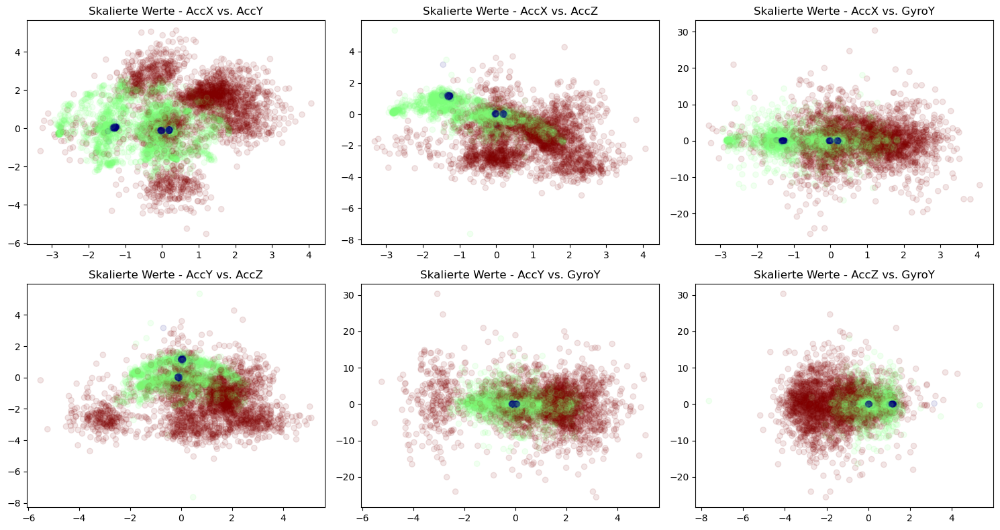

In [45]:
#from itertools import combinations
import pandas as pd
import matplotlib.pyplot as plt

# Skalierte Werte in einem neuen DataFrame mit den ursprünglichen Spaltennamen
data_scaled_df = pd.DataFrame(data_scaled, columns=data.columns)

# Erstelle eine temporäre Spalte 'class' basierend auf One-Hot-Encoding
data_scaled_df['class'] = data_scaled_df.apply(lambda row: 1 if row['RuheState'] == 1 else (2 if row['FernstState'] == 1 else 3), axis=1)

# Liste der ausgewählten Sensoren
selected_sensors = ['AccX', 'AccY', 'AccZ', 'GyroY']

# Erstelle alle möglichen Kombinationen von Label-Paaren für die ausgewählten Sensoren
label_pairs = list(combinations(selected_sensors, 2))
print(len(label_pairs))

# Anzahl der Zeilen und Spalten für die Subplots
num_rows = 2  # Festgelegte Anzahl der Zeilen basierend auf der Anzahl der ausgewählten Sensoren
num_cols = len(selected_sensors) - 1  # Eine Spalte weniger als die Anzahl der ausgewählten Sensoren

# Erstelle Subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 8))

# Iteriere durch Label-Paare und erstelle Scatterplots
for i in range(num_rows):
    for j in range(num_cols):
        label_pair = label_pairs[i * num_cols + j]
        axs[i, j].scatter(data_scaled_df[label_pair[0]], data_scaled_df[label_pair[1]], alpha=0.1, c=data_scaled_df['class'], cmap=plt.get_cmap('jet'))
        axs[i, j].set_title(f'Skalierte Werte - {label_pair[0]} vs. {label_pair[1]}')

# Verbessere das Layout
plt.tight_layout()
plt.show()


In [54]:
# Extrahiere die Features für die ausgewählten Sensoren
train_features = data_scaled_df[selected_sensors]
val_features = val[selected_sensors]

# Extrahiere die Labels
train_labels = data_scaled_df['class']

val_labels = pd.DataFrame(columns=['class'])
val_labels = val.apply(lambda row: 1 if row['RuheState'] == 1 else (2 if row['FernstState'] == 1 else 3), axis=1)

In [52]:
train_labels

1516    2
7966    1
5221    2
3122    3
1034    2
       ..
5734    2
5191    2
5390    2
860     3
7270    1
Name: class, Length: 8208, dtype: int64

In [55]:
val_labels

8225    1
3133    3
1446    2
4568    3
6022    2
       ..
9050    1
8903    1
3204    3
4078    3
5516    2
Length: 912, dtype: int64

In [56]:
from sklearn import neighbors
import numpy as np

# K-NN Klassifikator
k = 5
clf = neighbors.KNeighborsClassifier(n_neighbors=k)

# Training des Klassifikators
clf.fit(train_features, train_labels)

KNeighborsClassifier()

In [57]:
# Prediction für Trainingsdaten
train_prediction = clf.predict(train_features)

# Prediction für Validierungsdaten
val_prediction = clf.predict(val_features)

In [58]:
# Berechne Trainingsgenauigkeit
train_acc = np.mean(train_prediction == train_labels.astype(int).values)
print(f"Train Accuracy: {train_acc}")

# Berechne Validierungsgenauigkeit
val_acc = np.mean(val_prediction == val_labels.astype(int).values)
print(f"Validation Accuracy: {val_acc}")

Train Accuracy: 0.9428606237816765
Validation Accuracy: 0.9287280701754386
